In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from tabulate import tabulate
from sklearn.preprocessing import MultiLabelBinarizer
from datetime import datetime
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import glob
import os

In [7]:
path_central_novice = './CentralR-N'
all_files_central_novice = sorted(glob.glob(os.path.join(path_central_novice, "*.json")))

central = []
for f in all_files_central_novice:
    df = pd.read_json(f)
    df['logDate'] = f[25:35]
    df['logDate'] = pd.to_datetime(df['logDate'], format='%Y-%m-%d')
    central.append(df)
    
central_novice = pd.concat(central, ignore_index=True)
central_novice['region'] = 'Central'

path_east_novice = './EastR-N'
all_files_east_novice = sorted(glob.glob(os.path.join(path_east_novice, "*.json")))

east = []
for f in all_files_east_novice:
    df = pd.read_json(f)
    df['logDate'] = f[22:32]
    df['logDate'] = pd.to_datetime(df['logDate'], format='%Y-%m-%d')
    east.append(df)
    
east_novice = pd.concat(east, ignore_index=True)
east_novice['region'] = 'East'

novice = pd.concat(([central_novice, east_novice]), ignore_index=True)
X = novice.drop(['annId', 'urls', 'siteIds', 'animeScore', 'selfAnswer', 'fromList', 'gameMode', 'correct'], axis=1).copy()


def find_n_correct(players):
    i = 0
    for player in players:
        if player['correct'] == True:
            i += 1
    return i

def find_gt(players):
    guess_times = [x['guessTime'] for x in players if 'guessTime' in x]
    return np.array(guess_times).mean()

def find_gt_filter(players):
    guess_times = [x['guessTime'] for x in players if 'guessTime' in x and x['guessTime'] < 15000]
    return np.array(guess_times).mean()

def find_ng(players):
    no_guess = np.zeros(len(players))
    for i, x in enumerate(players):
        val = 0
        if x['active'] == True:
            if 'guessTime' in x:
                val = 0
            else:
                val = 1
        else:
            continue
        no_guess[i] = val
    return no_guess.sum()

def find_ng_filter(players):
    no_guess = np.zeros(len(players))
    for i, x in enumerate(players):
        val = 0
        if x['active'] == True:
            if 'guessTime' in x and x['guessTime'] < 15000:
                val = 0
            else:
                val = 1
        else:
            continue
        no_guess[i] = val
    return no_guess.sum()

def find_cgt(players):
    guess_times = np.array([x['guessTime'] for x in players if ('guessTime' in x and x['correct'] == True)])
    return np.array(guess_times).mean()

def find_igt(players):
    guess_times = np.array([x['guessTime'] for x in players if ('guessTime' in x and x['correct'] == False)])
    return np.array(guess_times).mean()

def shortest_answer_length(answers):
    return len(min(answers, key=len))

def find_shortest_answer(answers):
    return min(answers, key=len)

def fastest_guess(players):
    guess_times = np.array([x['guessTime'] if 'guessTime' in x else 20000 for x in players])
    return np.min(guess_times)

def fastest_correct_guess(players):
    guess_times = np.array([x['guessTime'] if ('guessTime' in x and x['correct'] == True) else 20000 for x in players])
    return np.min(guess_times)

def guess_time_dist(players):
    guess_times = [x['guessTime'] for x in players if 'guessTime' in x]
    return np.array(guess_times)

X['avgGuessTime'] = X['players'].apply(find_gt)
X['avgGuessTime_15k'] = X['players'].apply(find_gt_filter)
X['n_correctGuess'] = X['players'].apply(find_n_correct)
X['n_noGuess'] = X['players'].apply(find_ng)
X['n_noGuess_15k'] = X['players'].apply(find_ng_filter)
X['p_noGuess'] = X['n_noGuess']/X['activePlayers'] *100
X['p_Guess'] = 100 - X['p_noGuess']
X['p_noGuess_15k'] = X['n_noGuess_15k']/X['activePlayers'] *100
X['p_Guess_15k'] = 100 - X['p_noGuess_15k']
X['p_correctGuess'] = X['n_correctGuess']/X['activePlayers']*100
X['avgGuessTime_c'] = X['players'].apply(find_cgt)
X['avgGuessTime_i'] = X['players'].apply(find_igt)
X['type_noNumber'] = X['type'].str.split().str[0]
X['samplePercent'] = X['startSample']/X['videoLength']
X['AiredDate'] = X['vintage'].replace({'Winter': '1', 'Spring': '4', 'Summer': '7', 'Fall': '10'}, regex=True)
X['AiredDate'] = pd.to_datetime(X['AiredDate'], format='%m %Y')
X['shortest_length'] = X['altAnswers'].apply(shortest_answer_length)
X['shortest_answer'] = X['altAnswers'].apply(find_shortest_answer)
X['fastest'] = X['players'].apply(fastest_guess)
X['fastest_correct'] = X['players'].apply(fastest_correct_guess)
X['guessTime_dist'] = X['players'].apply(guess_time_dist)

def find_jp(names):
    if 'romaji' in names:
        name = names['romaji']
    else:
        raise Exception('No jp name')
    return name
X['anime_jp'] = X['anime'].apply(find_jp)

lbs = {'difficulty':'Difficulty',
      'artist':'Artist',
      'name':'Song',
      'p_correctGuess':'Correct percent',
      'p_noGuess':'No guess percent',
      'anime_jp':'Anime',
      'avgGuessTime':'Average guess time',
      'AiredDate': 'Aired date',
      'avgGuessTime_c':'Correct avg. guess time',
      'avgGuessTime_i':'Incorrect avg. guess time',
      'type_noNumber':'Song type'}

hover_dt = {'artist':True,
           'name':True,
           'anime_jp':True,
           'avgGuessTime':True,
           'difficulty':':.1f',
           'p_noGuess':':.1f',
           'p_correctGuess':':.1f',
           'avgGuessTime':':.1f',
           'avgGuessTime_c':':.1f',
           'avgGuessTime_i':':.1f',}

/var/folders/7h/lb5014td1szbmsjlhhy0swz00000gn/T/ipykernel_2521/3035434850.py:76: RuntimeWarning:

Mean of empty slice.

/var/folders/7h/lb5014td1szbmsjlhhy0swz00000gn/T/ipykernel_2521/3035434850.py:80: RuntimeWarning:

Mean of empty slice.



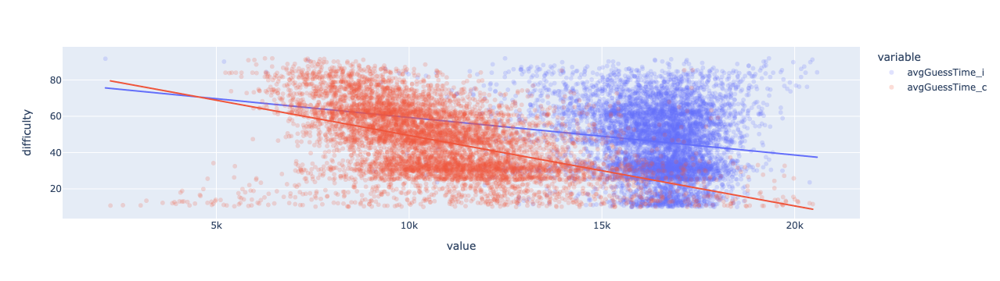

In [3]:
px.scatter(X, x=[ 'avgGuessTime_i', 'avgGuessTime_c'], y='difficulty', trendline='ols', opacity=0.2)

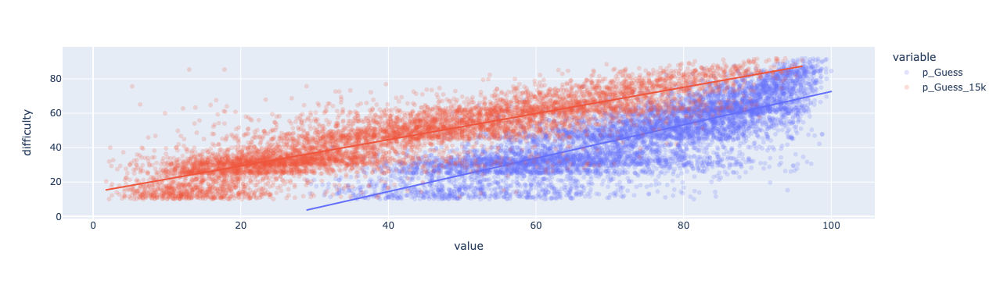

In [4]:
px.scatter(X, x=['p_Guess', 'p_Guess_15k'], y='difficulty', trendline='ols', opacity=0.2)

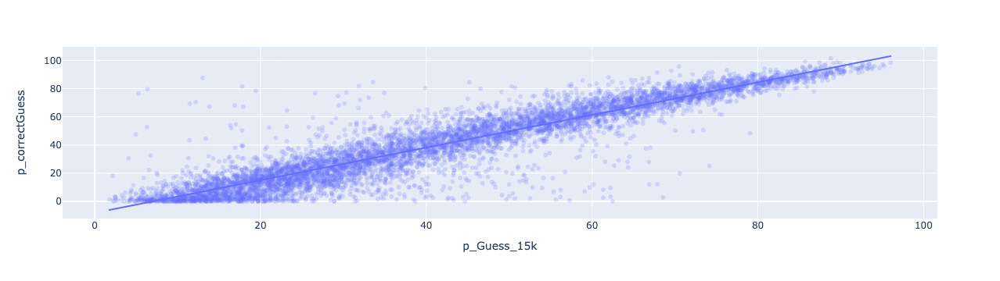

In [5]:
px.scatter(X, x='p_Guess_15k', y='p_correctGuess', trendline='ols', opacity=0.2)

In [27]:
X.loc[(X['shortest_answer'] == 'Gate')]

,name,artist,anime,songNumber,activePlayers,totalPlayers,type,difficulty,animeType,vintage,...,avgGuessTime_i,type_noNumber,samplePercent,AiredDate,shortest_length,shortest_answer,fastest,fastest_correct,guessTime_dist,anime_jp
18,GATE II~Sekai o Koete~,Kishida Kyoudan &THE Akeboshi Rockets,"{'english': 'Gate', 'romaji': 'Gate: Jieitai K...",19,235,242,Opening 1,60.0,TV,Winter 2016,...,16382.321429,Opening,0.412854,2016-01-01,4,Gate,2571,2571,"[2772, 18479, 18479, 5802, 15095, 18479, 8795,...","Gate: Jieitai Kanochi nite, Kaku Tatakaeri"
851,GATE II~Sekai o Koete~,Kishida Kyoudan &THE Akeboshi Rockets,"{'english': 'Gate', 'romaji': 'Gate: Jieitai K...",42,226,240,Opening 1,59.9,TV,Winter 2016,...,15223.258621,Opening,0.624861,2016-01-01,4,Gate,2362,2362,"[4173, 6425, 11123, 14123, 18445, 16825, 9073,...","Gate: Jieitai Kanochi nite, Kaku Tatakaeri"
1649,Itsudatte Communication,Hisako Kanemoto & Nao Touyama & Risa Taneda,"{'english': 'Gate', 'romaji': 'Gate: Jieitai K...",30,215,225,Ending 1,29.7,TV,Winter 2016,...,17039.328571,Ending,0.201568,2016-01-01,4,Gate,2564,2564,"[19434, 20454, 4968, 10362, 16408, 11368, 1943...","Gate: Jieitai Kanochi nite, Kaku Tatakaeri"
1809,GATE II~Sekai o Koete~,Kishida Kyoudan &THE Akeboshi Rockets,"{'english': 'Gate', 'romaji': 'Gate: Jieitai K...",10,199,202,Opening 1,60.2,TV,Winter 2016,...,15228.942857,Opening,0.502120,2016-01-01,4,Gate,1779,1779,"[19739, 6187, 8996, 12401, 6788, 14444, 7191, ...","Gate: Jieitai Kanochi nite, Kaku Tatakaeri"
2294,GATE II~Sekai o Koete~,Kishida Kyoudan &THE Akeboshi Rockets,"{'english': 'Gate', 'romaji': 'Gate: Jieitai K...",45,231,249,Opening 1,60.2,TV,Winter 2016,...,16854.396552,Opening,0.145057,2016-01-01,4,Gate,2399,2399,"[2399, 20280, 19257, 13386, 17429, 8885, 7851,...","Gate: Jieitai Kanochi nite, Kaku Tatakaeri"
2367,GATE II~Sekai o Koete~,Kishida Kyoudan &THE Akeboshi Rockets,"{'english': 'Gate', 'romaji': 'Gate: Jieitai K...",28,223,229,Opening 1,60.2,TV,Winter 2016,...,16155.476190,Opening,0.334747,2016-01-01,4,Gate,2369,2369,"[16247, 16247, 2369, 6410, 17868, 3774, 6611, ...","Gate: Jieitai Kanochi nite, Kaku Tatakaeri"
3440,GATE II~Sekai o Koete~,Kishida Kyoudan &THE Akeboshi Rockets,"{'english': 'Gate', 'romaji': 'Gate: Jieitai K...",21,138,144,Opening 1,59.9,TV,Winter 2016,...,15822.020408,Opening,0.145057,2016-01-01,4,Gate,3176,3176,"[9394, 20424, 4780, 13602, 16819, 7391, 20285,...","Gate: Jieitai Kanochi nite, Kaku Tatakaeri"
3764,Itsudatte Communication,Hisako Kanemoto & Nao Touyama & Risa Taneda,"{'english': 'Gate', 'romaji': 'Gate: Jieitai K...",30,168,169,Ending 1,30.1,TV,Winter 2016,...,17764.227273,Ending,0.279955,2016-01-01,4,Gate,2247,2247,"[13495, 8872, 12686, 8670, 13296, 20480, 19912...","Gate: Jieitai Kanochi nite, Kaku Tatakaeri"
4056,GATE~Sore wa Akatsuki no You ni~,Kishida Kyoudan &THE Akeboshi Rockets,"{'english': 'Gate', 'romaji': 'Gate: Jieitai K...",7,153,153,Opening 1,67.0,TV,Summer 2015,...,16480.027778,Opening,0.588758,2015-07-01,4,Gate,2400,2400,"[13320, 6650, 20547, 3199, 3798, 17728, 6650, ...","Gate: Jieitai Kanochi nite, Kaku Tatakaeri"
4880,GATE~Sore wa Akatsuki no You ni~,Kishida Kyoudan &THE Akeboshi Rockets,"{'english': 'Gate', 'romaji': 'Gate: Jieitai K...",21,166,170,Opening 1,66.9,TV,Summer 2015,...,16437.781250,Opening,0.422128,2015-07-01,4,Gate,2565,2565,"[15064, 8638, 10640, 12844, 2965, 6840, 18681,...","Gate: Jieitai Kanochi nite, Kaku Tatakaeri"


In [30]:
h = X[(X['shortest_answer'] == 'High School of the Dead')]['guessTime_dist']
ht1 = np.concatenate(h.values).astype(int)

array([ 7968, 17925, 13099, 20150, 14099, 20344, 20150,  6569, 13300,
       18332, 14899, 16107, 20344,  7166, 13701, 20344, 20150, 20150,
       12692, 19542, 19132, 18928, 20150, 15099, 15701, 14899,  5354,
       18728, 15701, 20150, 18141, 19350, 12094, 17925, 11893, 15298,
       20150, 20344, 14698,  8369, 20344, 17925,  6767, 19744, 12493,
       16299, 19350, 20150, 20150, 15099, 14498,  9271, 13701, 20150,
       16903,  5969, 16299,  3534, 17109,  6166, 14498, 19943, 20150,
       17309, 15298, 10711,  9072, 11893,  7968, 17925, 16107,  5560,
       14099, 18526, 19350, 19744, 20150,  7166, 10711, 19542,  9271,
       17309, 10284, 13300, 20344, 16503, 19744, 10498,  7366, 19943,
       17309,  6968, 20344, 19744, 14299, 20150, 20150, 19350,  5560,
       16702, 16107, 19943,  6767, 19132, 20344, 10888,  6367, 18141,
       20150, 18332, 11893, 19542, 11487, 15499, 18928, 15298, 18728,
        9484, 18526, 19542, 20150, 20150,  4767, 19542, 20150, 20344,
       13499, 19943,

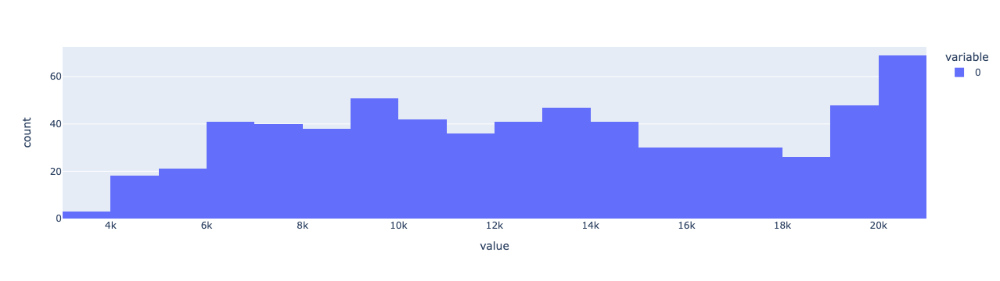

In [31]:
px.histogram(np.concatenate(h.values).astype(int))

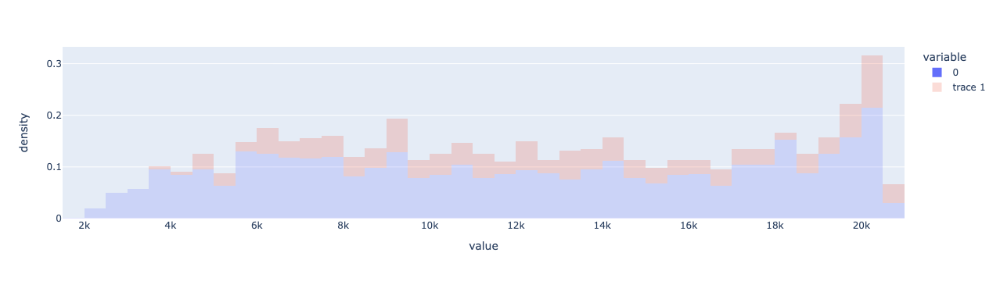

In [52]:
k = X[(X['shortest_answer'] == 'Gate')]['guessTime_dist']
h = X[(X['shortest_answer'] == 'High School of the Dead')]['guessTime_dist']
ht1 = np.concatenate(h.values).astype(int)
kt1 = np.concatenate(k.values).astype(int)
both = pd.DataFrame([ht1, kt1]).transpose()
fig = px.histogram(kt1, histnorm='density', opacity=0.2)
fig.add_trace(go.Histogram(x=ht1, histnorm='density', opacity=0.2))

<Axes: ylabel='Density'>

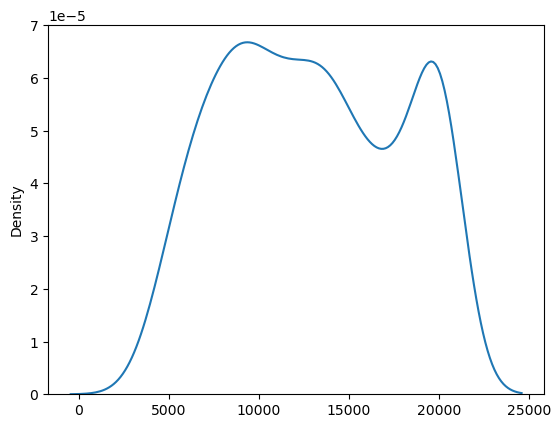

In [54]:
sns.kdeplot(ht1)

<Axes: ylabel='Density'>

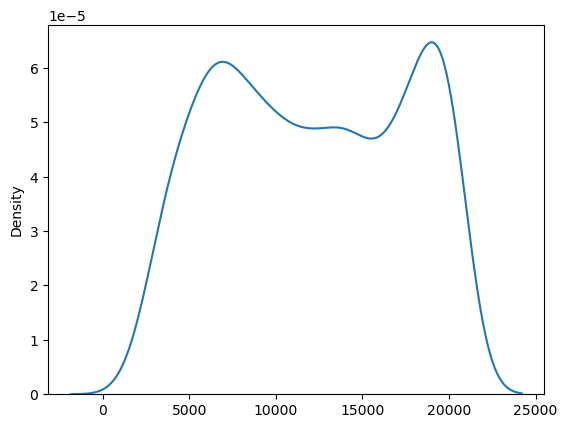

In [55]:
sns.kdeplot(kt1)